In [1]:
# !pip install imagehash > /dev/null

In [2]:
import sys
sys.path.append("..")

%matplotlib inline

In [3]:
import os
from typing import *

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


sns.set_style("whitegrid")

In [4]:
from dataclasses import dataclass


@dataclass
class InputPath:
    _prefix: str = "../input/"
    photo_prefix: str = f"{_prefix}/photos"
    train: str = f"{_prefix}/train.csv"
    materials: str = f"{_prefix}/materials.csv"
    techniques: str = f"{_prefix}/techniques.csv"
    test: str = f"{_prefix}/test.csv"
    sub: str = f"{_prefix}/atmaCup#11_sample_submission.csv"
        
        
def load_csv(path: str) -> pd.DataFrame:
    return pd.read_csv(path)

In [5]:
from PIL import Image


def get_image_path(object_id: str) -> str:
    return os.path.join(InputPath.photo_prefix, f"{object_id}.jpg")


def read_image(object_id: str) -> np.array:
    path = get_image_path(object_id)
    im = Image.open(path)
    im_array = np.asarray(im)
    return im_array

## EDA - metadata

### Train

In [6]:
train = load_csv(InputPath.train)
print(train.shape)
train.head()

(3937, 4)


,object_id,sorting_date,art_series_id,target
0,002bff09b09998d0be65,1631,509357f67692a6a45626,1
1,00309fb1ef05416f9c1f,1900,7987b47bbe5dc3039179,3
2,003a1562e97f79ba96dc,1834,ded7c3c9636708e5b14c,3
3,004890880e8e7431147b,1743,582ac2d7f0cef195b605,2
4,00718c32602425f504c1,1885,64c907f0c08dce4fb8e8,3


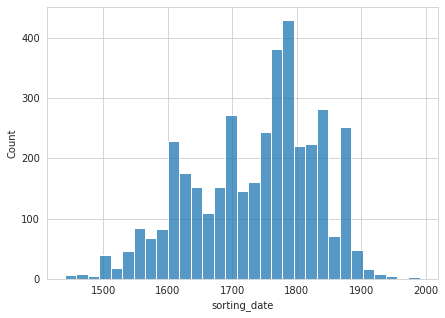

In [7]:
plt.figure(figsize=(7, 5))
sns.histplot(train["sorting_date"])
plt.show()

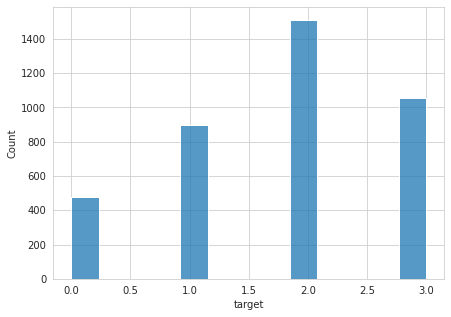

In [8]:
plt.figure(figsize=(7, 5))
sns.histplot(train["target"])
plt.show()

In [9]:
train.groupby('target')['sorting_date'].agg(['min', 'max', 'median', 'size'])

,min,max,median,size
target,,,,
0,1440,1600,1574,475
1,1601,1700,1655,896
2,1701,1800,1770,1511
3,1801,1991,1841,1055


In [10]:
train_agg = train.groupby("art_series_id").agg({"sorting_date": ["min", "max", "median", "size"]})
train_agg.columns = [f"{c[0]}_{c[1]}" for c in train_agg.columns]
train_agg = train_agg.sort_values("sorting_date_size", ascending=False)
train_agg = train_agg.assign(sorting_date_diff_min_max = train_agg["sorting_date_max"] - train_agg["sorting_date_min"])
train_agg.head(20)

,sorting_date_min,sorting_date_max,sorting_date_median,sorting_date_size,sorting_date_diff_min_max
art_series_id,,,,,
607c22f5e66e8d50a298,1633,1633,1633.0,9,0
6fb734ceff36fe2184b5,1848,1857,1848.0,7,9
78db88c5ca6d7f6f4ac6,1775,1819,1805.5,6,44
f8b88aff7f66a106ba3f,1819,1819,1819.0,4,0
600db76c79a01bc40eb1,1550,1700,1700.0,4,150
9f6b6e88a57613d73742,1645,1766,1645.0,4,121
aa56122c35a05b9075df,1700,1700,1700.0,3,0
2d29062fe2b09738757b,1775,1818,1775.0,3,43
6aa2a6ecc643ec58f8bc,1874,1874,1874.0,3,0


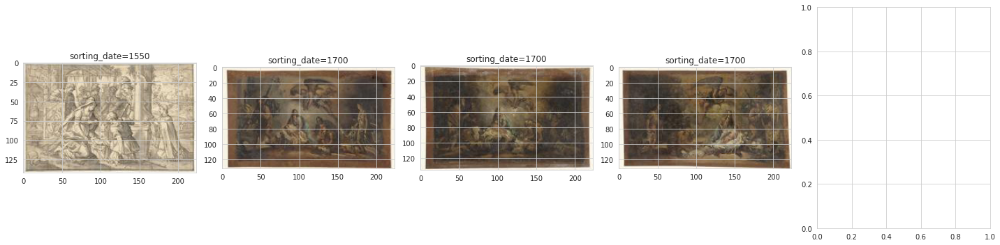

In [11]:
n = 5
c = 5
fig, axes = plt.subplots(n // 5, c, figsize=(20, n // 5 * 5))
for i in range(n):
    if i == 4:
        continue
    j = i // c
    k = i % c
    _train_art_series = train[train["art_series_id"]=="600db76c79a01bc40eb1"].reset_index(drop=True)
    row = _train_art_series.iloc[i]
    im_array = read_image(row["object_id"])
    axes[k].imshow(im_array)
    axes[k].set_title(f"sorting_date={row['sorting_date']}")
plt.tight_layout()
plt.show()
print("\n")

### Test

In [12]:
test = load_csv(InputPath.test)
print(test.shape)
test.head()

(5919, 1)


,object_id
0,0009e50b94be36ccad39
1,000bd5e82eb22f199f44
2,0015f44de1854f617516
3,00388a678879ba1efa27
4,005e1e7c6496902d23f3


### Materials

In [13]:
df_materials = load_csv(InputPath.materials)
print(df_materials.shape)
df_materials.head()

(9081, 2)


,name,object_id
0,ink,002bff09b09998d0be65
1,paper,002bff09b09998d0be65
2,pencil,002bff09b09998d0be65
3,watercolor (paint),00309fb1ef05416f9c1f
4,paper,00309fb1ef05416f9c1f


In [14]:
df_materials["name"].value_counts()

paper                          3746
ink                            1589
chalk                          1509
pencil                         1135
watercolor (paint)              543
deck paint                      130
graphite (mineral)              122
prepared paper                   91
parchment (animal material)      61
paint (coating)                  43
gouache (paint)                  38
oil paint (paint)                33
cardboard                        18
tracing paper                     8
linen (material)                  3
leather                           2
India ink (ink)                   2
zinc                              1
palm leaf (material)              1
wood (plant material)             1
velvet (fabric weave)             1
gold leaf                         1
metal                             1
varnish                           1
bristol board                     1
Name: name, dtype: int64

In [15]:
df_materials.groupby("object_id").size().value_counts().sort_index()

1     230
2    2493
3    1004
4     193
5      15
6       1
dtype: int64

In [16]:
def value_list(ser: pd.Series) -> Tuple[str]:
    return tuple(sorted(ser.unique().tolist()))


df_materials_agg = df_materials.groupby("object_id").agg({"name": value_list})
display(df_materials_agg.head(3))
df_materials_agg["name"].value_counts()

,name
object_id,
002bff09b09998d0be65,"(ink, paper, pencil)"
00309fb1ef05416f9c1f,"(paper, watercolor (paint))"
003a1562e97f79ba96dc,"(paper, pencil)"


(chalk, paper)                                     975
(ink, paper)                                       726
(paper, pencil)                                    484
(ink, paper, pencil)                               257
(chalk, ink, paper)                                203
                                                  ... 
(chalk, deck paint, pencil, prepared paper)          1
(cardboard, chalk, ink, paper)                       1
(chalk, ink, oil paint (paint), prepared paper)      1
(chalk, ink, paint (coating), prepared paper)        1
(cardboard, oil paint (paint))                       1
Name: name, Length: 122, dtype: int64

In [17]:
train_material = train.join(df_materials_agg, how="left", on="object_id")
display(train_material.head(3))
train_material_agg = train_material.groupby("name").agg({"target": ["min", "max", "mean", "size"]})
train_material_agg.columns = [f"{c[0]}_{c[1]}" for c in train_material_agg.columns]
train_material_agg = train_material_agg.sort_values("target_size", ascending=False)
train_material_agg[train_material_agg["target_size"]>10]

,object_id,sorting_date,art_series_id,target,name
0,002bff09b09998d0be65,1631,509357f67692a6a45626,1,"(ink, paper, pencil)"
1,00309fb1ef05416f9c1f,1900,7987b47bbe5dc3039179,3,"(paper, watercolor (paint))"
2,003a1562e97f79ba96dc,1834,ded7c3c9636708e5b14c,3,"(paper, pencil)"


,target_min,target_max,target_mean,target_size
name,,,,
"(chalk, paper)",0,3,1.873846,975
"(ink, paper)",0,3,1.287879,726
"(paper, pencil)",0,3,2.535124,484
"(ink, paper, pencil)",0,3,1.992218,257
"(chalk, ink, paper)",0,3,1.216749,203
"(paper,)",0,3,1.643979,191
"(paper, pencil, watercolor (paint))",0,3,2.178571,140
"(paper, watercolor (paint))",0,3,2.226891,119
"(chalk, paper, pencil)",0,3,2.398148,108


In [18]:
# for i in range(5):
#     plt.imshow(read_image(train_material[train_material["name"]==("prepared paper",)]["object_id"].iloc[i]))
#     plt.show()

In [19]:
len(set(train["object_id"].values.tolist()) - set(df_materials["object_id"].values.tolist()))

1

### Techniques

In [20]:
df_techniques = load_csv(InputPath.techniques)
print(df_techniques.shape)
df_techniques.head()

(3777, 2)


,name,object_id
0,pen,002bff09b09998d0be65
1,brush,00309fb1ef05416f9c1f
2,counterproof,004890880e8e7431147b
3,brush,007f5e3620b458d77212
4,brush,00bf812ffe8a62d45661


In [21]:
df_techniques["name"].value_counts()

brush                   2179
pen                     1569
counterproof              17
chalk                      3
pencil                     2
engraving                  2
snipping                   2
letterpress printing       1
scoring                    1
sewing                     1
Name: name, dtype: int64

In [22]:
df_techniques.groupby("object_id").size().value_counts().sort_index()

1    1369
2    1185
3      11
5       1
dtype: int64

In [23]:
def value_list(ser: pd.Series) -> Tuple[str]:
    return tuple(sorted(ser.unique().tolist()))


df_techniques_agg = df_techniques.groupby("object_id").agg({"name": value_list})
display(df_techniques_agg.head(3))
df_techniques_agg["name"].value_counts()

,name
object_id,
002bff09b09998d0be65,"(pen,)"
00309fb1ef05416f9c1f,"(brush,)"
004890880e8e7431147b,"(counterproof,)"


(brush, pen)                     1165
(brush,)                          973
(pen,)                            399
(counterproof,)                    15
(pencil,)                           2
(chalk,)                            2
(engraving,)                        2
(counterproof, pen)                 1
(sewing,)                           1
(scoring,)                          1
(brush, counterproof)               1
(brush, chalk, pen)                 1
(brush, letterpress printing)       1
(brush, snipping)                   1
(snipping,)                         1
Name: name, dtype: int64

In [24]:
train_technique = train.join(df_techniques_agg, how="left", on="object_id")
display(train_technique.head(3))
train_technique_agg = train_technique.fillna("unknown").groupby("name").agg({"target": ["min", "max", "mean", "size"]})
train_technique_agg.columns = [f"{c[0]}_{c[1]}" for c in train_technique_agg.columns]
train_technique_agg = train_technique_agg.sort_values("target_size", ascending=False)
# train_technique_agg[train_technique_agg["target_size"]>10]
train_technique_agg

,object_id,sorting_date,art_series_id,target,name
0,002bff09b09998d0be65,1631,509357f67692a6a45626,1,"(pen,)"
1,00309fb1ef05416f9c1f,1900,7987b47bbe5dc3039179,3,"(brush,)"
2,003a1562e97f79ba96dc,1834,ded7c3c9636708e5b14c,3,NaN


,target_min,target_max,target_mean,target_size
name,,,,
unknown,0,3,2.175055,1371
"(brush, pen)",0,3,1.490987,1165
"(brush,)",0,3,1.831449,973
"(pen,)",0,3,1.353383,399
"(counterproof,)",0,2,1.466667,15
"(chalk,)",1,1,1.000000,2
"(engraving,)",0,0,0.000000,2
"(pencil,)",1,2,1.500000,2
"(brush, chalk, pen)",1,1,1.000000,1


In [25]:
len(set(train["object_id"].values.tolist()) - set(df_techniques["object_id"].values.tolist()))

1371

## EDA - image

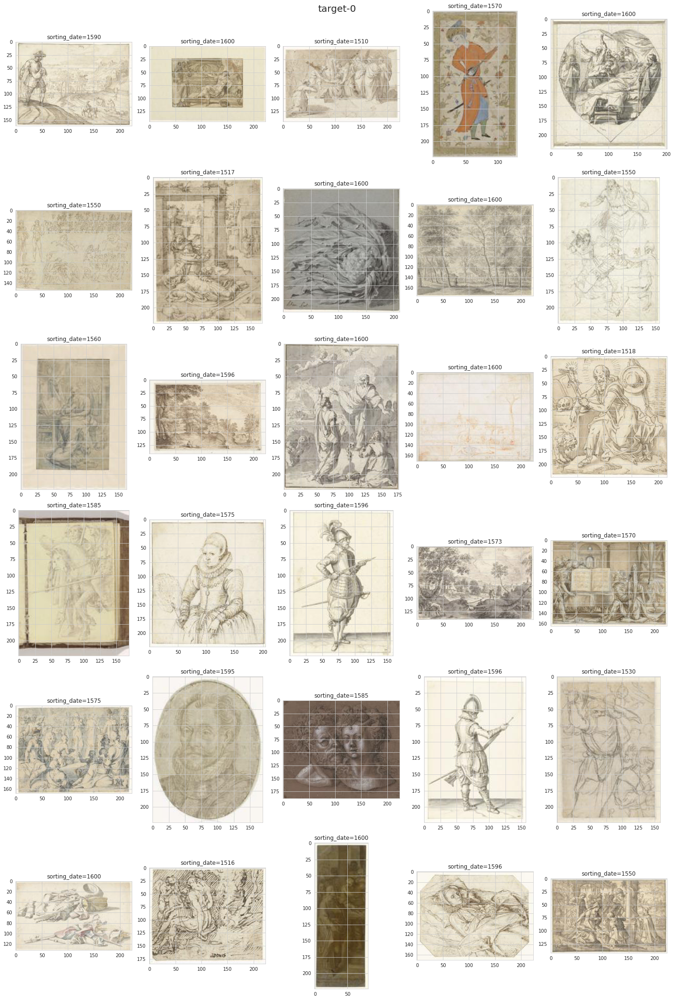

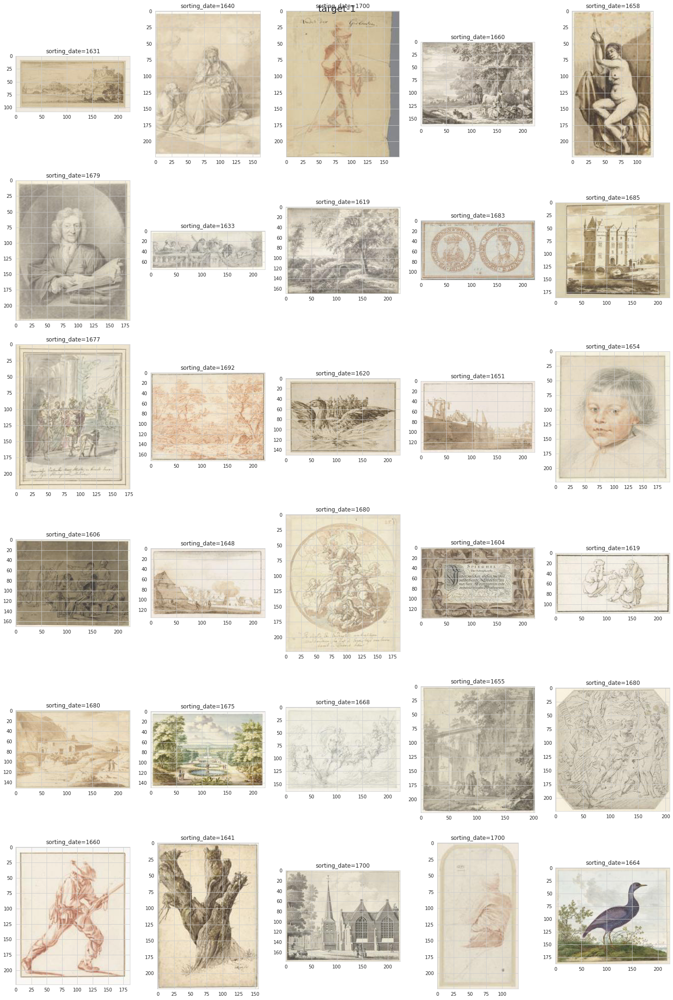

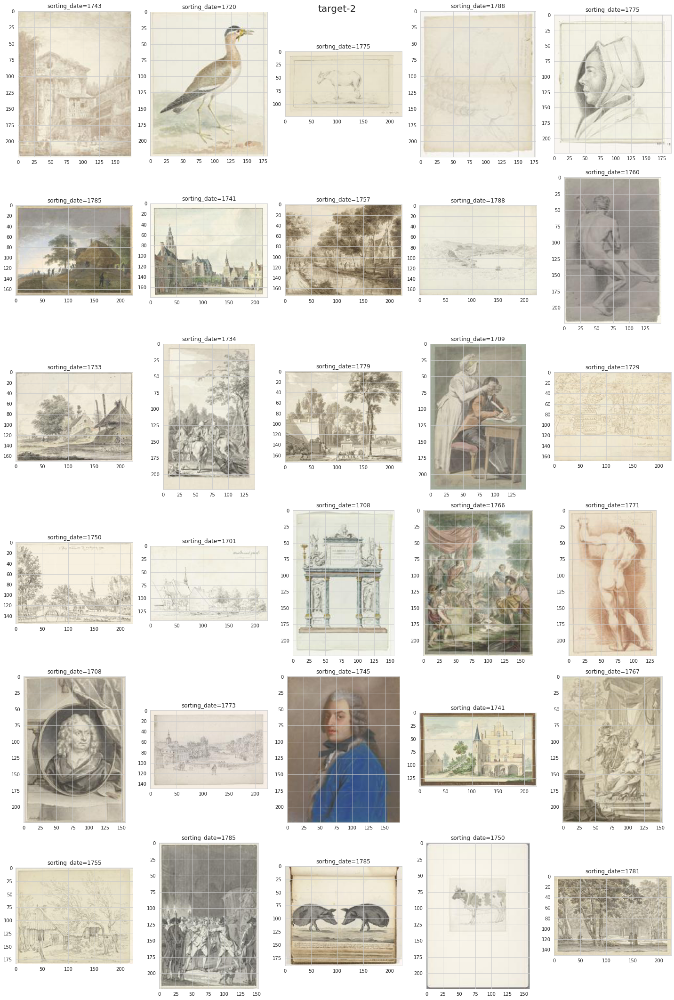

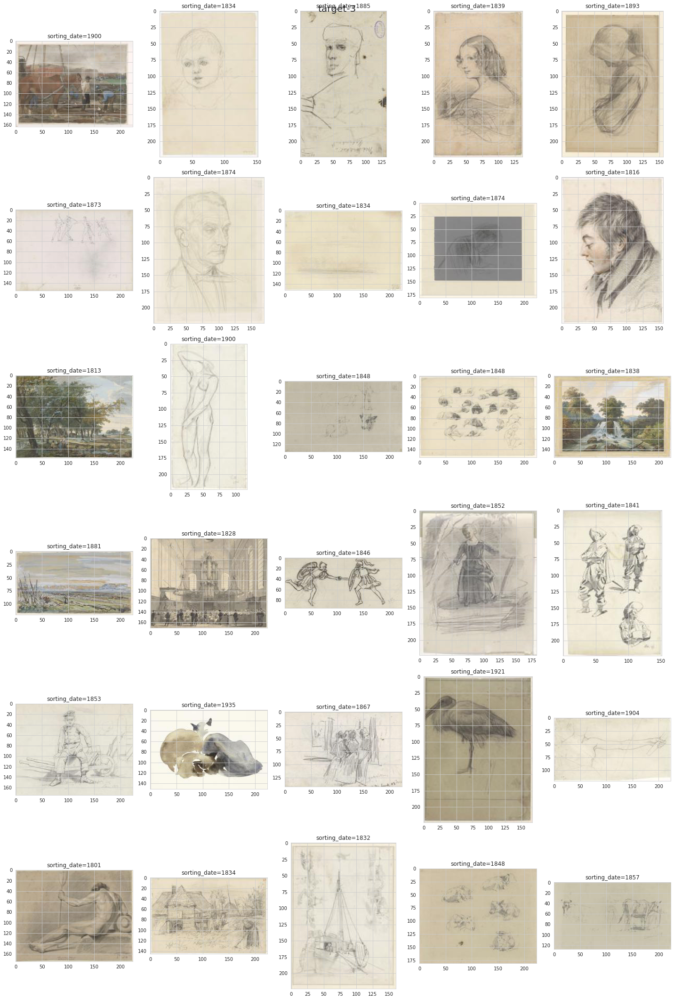

In [26]:
n = 30
c = 5
for t in range(4):
    fig, axes = plt.subplots(n // 5, c, figsize=(20, n // 5 * 5))
    for i in range(n):
        j = i // c
        k = i % c
        _train_target = train[train["target"]==t].reset_index(drop=True)
        row = _train_target.iloc[i]
        im_array = read_image(row["object_id"])
        axes[j, k].imshow(im_array)
        axes[j, k].set_title(f"sorting_date={row['sorting_date']}")
    plt.suptitle(f"target-{row['target']}", size=20)
    plt.tight_layout()
    plt.show()
    print("\n")

### Imagehash

In [27]:
# https://www.kaggle.com/appian/let-s-find-out-duplicate-images-with-imagehash
import torch
import imagehash
from tqdm import tqdm


def run(df):
    funcs = [
        imagehash.average_hash,
        imagehash.phash,
        imagehash.dhash,
        imagehash.whash,
    ]
    object_ids = []
    hashes = []
    for object_id in tqdm(set(df["object_id"].values.tolist())):
        path = get_image_path(object_id)
        image = Image.open(path)
        hashes.append(np.array([f(image).hash for f in funcs]).reshape(256))
        object_ids.append(object_id)
    return object_ids, np.array(hashes)


train_test = pd.concat((train, test), axis=0, ignore_index=True)

%time object_ids, hashes_all = run(train_test)

100%|██████████| 9856/9856 [00:30<00:00, 324.36it/s]

CPU times: user 30.4 s, sys: 117 ms, total: 30.5 s
Wall time: 30.4 s


In [28]:
hashes_all = torch.Tensor(hashes_all.astype(int)).cuda()

In [29]:
%time sims = np.array([(hashes_all[i] == hashes_all).sum(dim=1).cpu().numpy()/256 for i in range(hashes_all.shape[0])])

CPU times: user 1.39 s, sys: 589 ms, total: 1.98 s
Wall time: 1.98 s


In [34]:
threhold = 0.89
indices1 = np.where(sims > threhold)
indices2 = np.where(indices1[0] != indices1[1])
object_ids1 = [object_ids[i] for i in indices1[0][indices2]]
object_ids2 = [object_ids[i] for i in indices1[1][indices2]]
dups = {tuple(sorted([object_id1, object_id2])):True for object_id1, object_id2 in zip(object_ids1, object_ids2)}
print('found %d duplicates' % len(dups))

found 42 duplicates


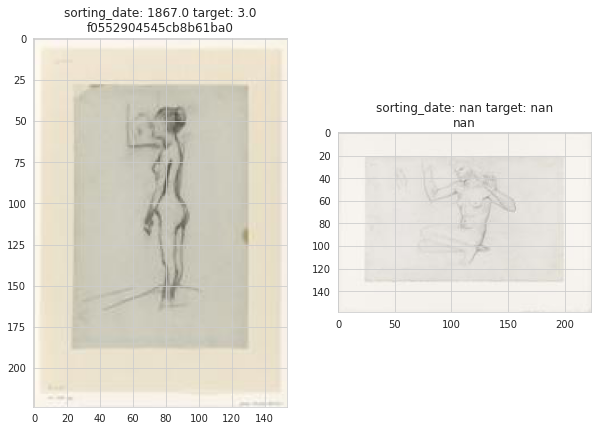

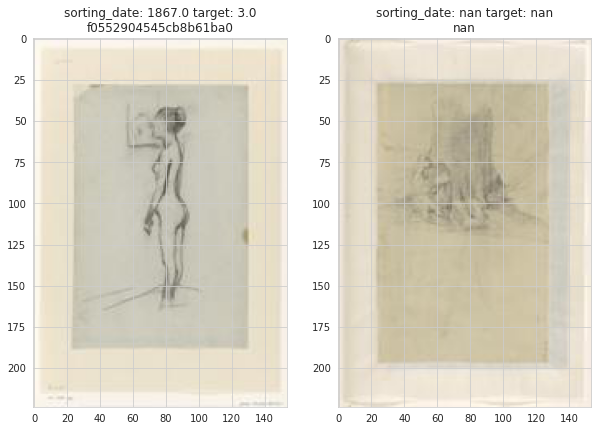

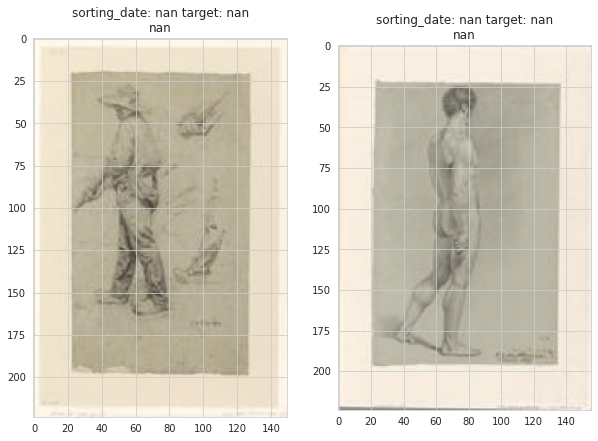

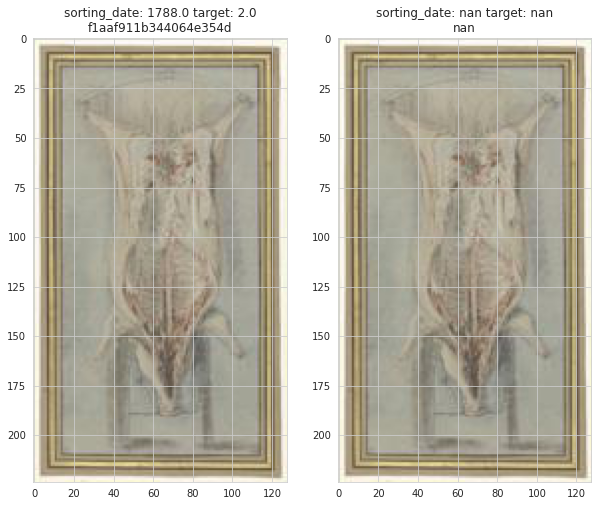

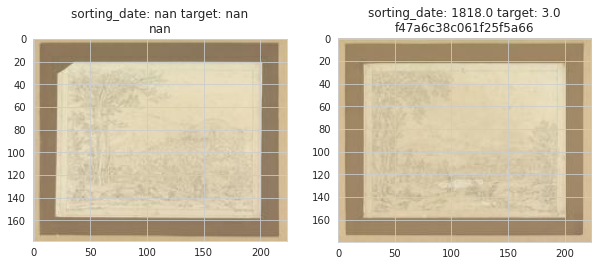

...

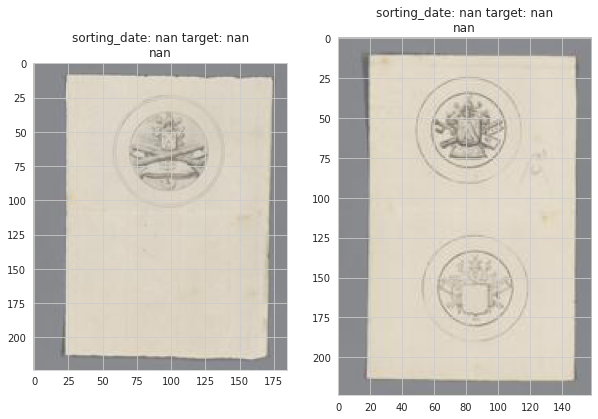

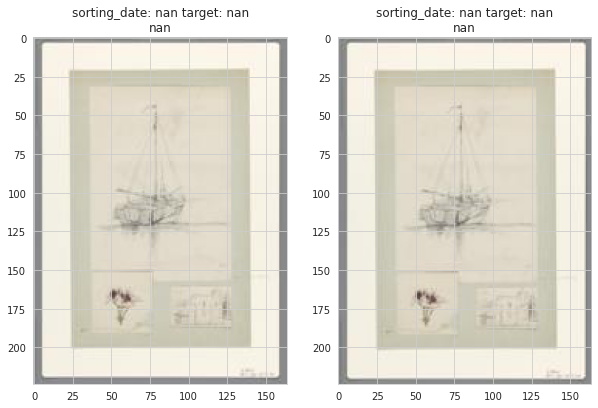

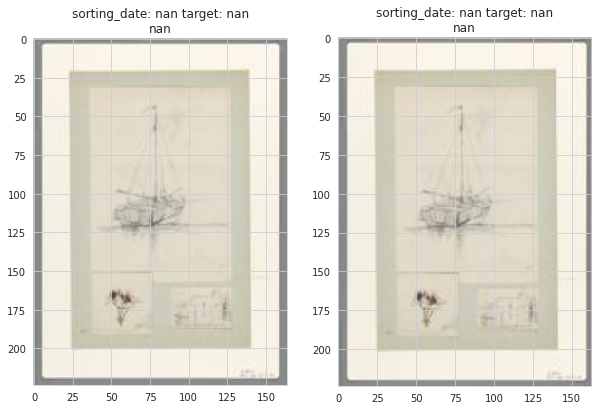

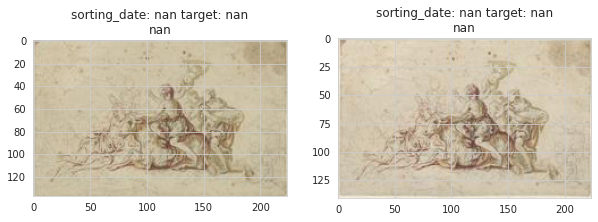

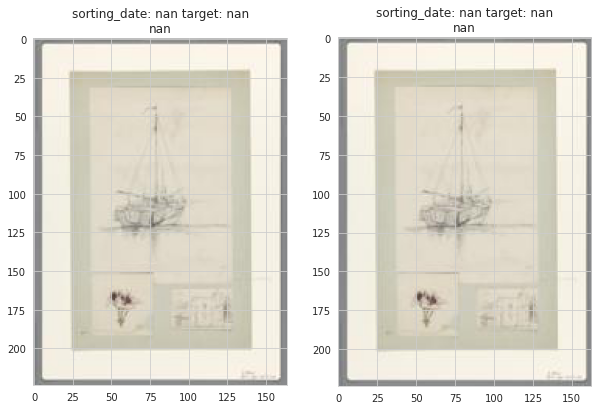

In [35]:
for object_id1, object_id2 in sorted(list(dups)):
    row1 = train_test[train_test["object_id"]==object_id1]
    row2 = train_test[train_test["object_id"]==object_id2]
    
    fig = plt.figure(figsize=(10, 20))
    fig.add_subplot(1,2,1)
    plt.title(f"sorting_date: {row1['sorting_date'].iloc[0]} target: {row1['target'].iloc[0]}\n{row1['art_series_id'].iloc[0]}")
    plt.imshow(read_image(object_id1))
    fig.add_subplot(1,2,2)
    plt.title(f"sorting_date: {row2['sorting_date'].iloc[0]} target: {row2['target'].iloc[0]}\n{row2['art_series_id'].iloc[0]}")
    plt.imshow(read_image(object_id2))
    plt.show()